# Large Language and Vision Assistant (LLAVA)  

## Bridging Vision and Language for Real-World Use  
Imagine an assistant capable of answering your questions about an image—whether it’s explaining the ingredients of a recipe from a photo of a dish or summarizing the plot of a comic panel. This kind of seamless interaction between visual understanding and language is at the core of **LLAVA**. It’s a cutting-edge, end-to-end trained large multimodal model that connects a vision encoder with a large language model (LLM) to achieve general-purpose visual and language understanding.  

## How Does Language Describe Image Content?  
Several existing models excel at describing image content using language:  
- **BLIP (Bootstrapped Language-Image Pre-training):** Focuses on generating descriptive captions for images.  
- **CLIP (Contrastive Language-Image Pre-training):** Matches textual descriptions to images effectively, facilitating tasks like image search.  
- **IDEFICS:** Excels in tasks such as visual question answering by integrating rich visual semantics into its language predictions.  

## Drawbacks of Current Approaches  
While these models leverage language to map visual signals to semantic meaning—a vital channel for human communication—they often fall short when it comes to interactivity and adaptability to user instructions. Why?  
1. **Fixed Interfaces:** Current models are usually trained with predefined tasks, limiting their flexibility to adapt to dynamic user queries.  
2. **Limited Context Understanding:** These models may struggle to consider nuanced instructions or adapt their behavior based on evolving interactions.  

LLAVA addresses these limitations by enhancing the synergy between vision and language, enabling richer interactivity and adaptability. This makes it a powerful tool for applications where dynamic, user-specific responses to visual content are essential.  




In [1]:
# import requests
from PIL import Image
import torch
from transformers import AutoProcessor, LlavaForConditionalGeneration
from transformers import BitsAndBytesConfig

config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_use_double_quant=True,
    bnb_4bit_compute_dtype=torch.bfloat16,
)

# Load the model in half-precision
model = LlavaForConditionalGeneration.from_pretrained("llava-hf/llava-1.5-7b-hf", 
quantization_config=config, 
torch_dtype=torch.float16, 
device_map="auto")
processor = AutoProcessor.from_pretrained("llava-hf/llava-1.5-7b-hf")


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Some kwargs in processor config are unused and will not have any effect: num_additional_image_tokens. 


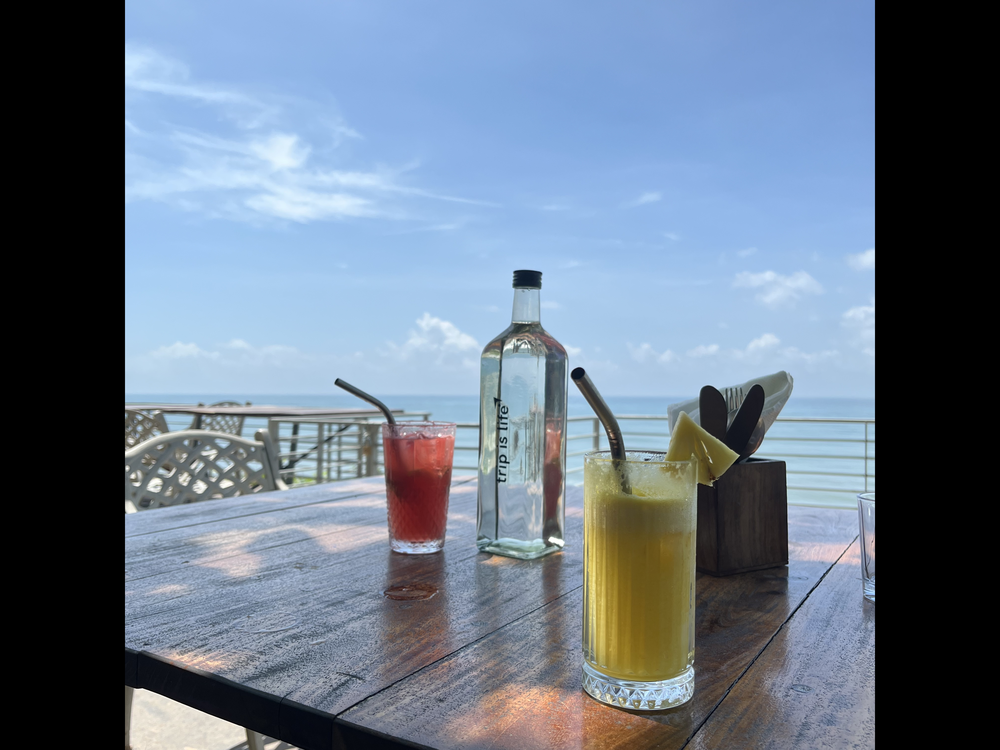

In [2]:
# url = "https://www.ilankelman.org/stopsigns/australia.jpg"
# image_stop = Image.open(requests.get(url, stream=True).raw)
# image_stop
image_path = "../../images/46B6C506-5EC5-4A45-B59A-B023E5E38B77.JPG"
image_trip = Image.open(image_path).rotate(270)
image_trip

In [3]:
conversation = [
    {
        "role": "user",
        "content": [
            {"type": "image"},
            {"type": "text", "text": "What is in the image?"},
            ],
    }]

In [ ]:
text_prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)
text_prompt

"USER: <image>\nThis image was clicked in a cafe called 'trip is life' in Varkala, Kerala. What is in the image? ASSISTANT:"

In [ ]:
# We can simply feed images in the order they have to be used in the text prompt
inputs = processor(images=[image_trip], text=[text_prompt], padding=True, return_tensors="pt").to(model.device, torch.float16)

## LLaVA Model Input Components




In [86]:
inputs.keys()

dict_keys(['input_ids', 'attention_mask', 'pixel_values'])

### `input_ids`
- **Description**: Tokenized representation of the text input (e.g., conversation history or prompt).
- **Shape**: `[batch_size, seq_len]`
- **Purpose**: Provides the textual input as token IDs.

In [87]:
inputs['input_ids'].shape

torch.Size([1, 617])

### `attention_mask`
- **Description**: Indicates which tokens in `input_ids` are real tokens (`1`) and which are padding (`0`).
- **Shape**: `[batch_size, seq_len]`
- **Purpose**: Masks out padding tokens during model processing.

In [88]:
inputs['attention_mask'].shape

torch.Size([1, 617])

### `pixel_values`
- **Description**: Preprocessed image tensor representing the input image(s).
- **Shape**: `[batch_size, num_channels, height, width]`
- **Purpose**: Provides visual input to the model for multimodal tasks.

In [89]:
inputs['pixel_values'].shape

torch.Size([1, 3, 336, 336])

## Generating output

The model.generate method in LLaVA models generates a sequence of tokens (text) based on the provided input, which can include both textual and visual data.

 - Input: The method takes tokenized text (input_ids) and associated visual information (pixel_values) as inputs.
 - Token Generation: Using a transformer-based architecture, the model predicts the next token in the sequence, considering both the textual context and the image input.
 - Iterative Process: The model generates tokens iteratively, expanding the sequence with each step, until a stopping condition (e.g., maximum token length or an end token) is met.
 - Output: The generated sequence of token IDs is the output.

In [90]:
generate_ids = model.generate(**inputs, max_new_tokens=200)
generate_ids

tensor([[    1,  3148,  1001, 29901, 29871, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000, 32000,
         32000, 32000, 32000, 32000, 32000, 32000, 3

In [91]:
output = processor.batch_decode(generate_ids, skip_special_tokens=True)
output

["USER:  \nThis image was clicked in a cafe called 'trip is life' in Varkala, Kerala. What is in the image? ASSISTANT: The image features a table with two glasses of juice, a bottle of vodka, and a straw. The table is located near a railing, and there is a chair nearby. The setting appears to be a cafe or a similar establishment."]

## Helper functions to chat with assistant

In [64]:
def append_assistant_response(model_output: str, conversation: list) -> list:
    """
    Parses the model's output, extracts the assistant's response, formats it into a conversation entry,
    and appends it to the conversation list.

    Args:
        model_output (str): The raw output from the model, including the `ASSISTANT:` prefix.
        conversation (list): The existing conversation history to append to.

    Returns:
        list: Updated conversation list with the new assistant entry.
    """
    # Strip and clean the model's output
    model_output = model_output.strip()
    
    # Check if ASSISTANT prefix exists and split to isolate the content
    if "ASSISTANT:" in model_output:
        assistant_text = model_output.split("ASSISTANT:")[-1]
        assistant_text = assistant_text.strip()  # Remove extra spaces
    else:
        raise ValueError("Model output does not contain 'ASSISTANT:' text.")

    # Format the assistant's response into the required dictionary format
    new_entry = {
        "role": "assistant",
        "content": [{"type": "text", "text": assistant_text}]
    }
    
    # Append the new entry to the conversation list
    conversation.append(new_entry)
    return conversation

def append_user_question(content: str, conversation: list) -> list:
    """
    Appends a user question to the conversation list.

    Args:
        content (str): The user's query or question.
        conversation (list): The existing conversation history.

    Returns:
        list: Updated conversation list with the new user entry.
    """
    # Format the user's query into the required dictionary format
    new_entry = {
        "role": "user",
        "content": [{"type": "text", "text": content}]
    }
    
    # Append the new entry to the conversation list
    conversation.append(new_entry)
    return conversation

def get_assistant_response(conversation: list, image: Image, new_tokens: int = 200):
    """
    Generates a response from the assistant model based on the provided conversation history.

    Args:
        conversation (list): A list of dictionaries representing the conversation history. 
                             Each dictionary contains a `role` ("user" or "assistant") 
                             and `content` (a list of text snippets).

    Returns:
        list: A list of strings representing the assistant's generated response(s).

    Workflow:
        1. Create a text prompt using the conversation history.
        2. Prepare the input for the model by combining the text prompt and images.
        3. Generate a response from the model using its `generate` method.
        4. Decode the model's output into human-readable text.
    """
    # Step 1: Generate a text prompt from the conversation using the processor
    text_prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)
    
    # Step 2: Prepare inputs for the model, including images and text prompt
    # The images are fed in the same order they correspond to in the text prompt
    inputs = processor(
        images=[image],  # Add the relevant image(s) to the processor
        text=[text_prompt],   # Use the generated text prompt
        padding=True,         # Ensure padding for batch processing
        return_tensors="pt"   # Return PyTorch tensors
    ).to(model.device, torch.float16)  # Move inputs to the model's device and use 16-bit precision
    
    # Step 3: Generate response IDs from the model
    generate_ids = model.generate(**inputs, max_new_tokens=new_tokens)
    
    # Step 4: Decode the generated response IDs into readable text
    output = processor.batch_decode(generate_ids, skip_special_tokens=True)

    return output


In [80]:
new_conversation = append_assistant_response(output[0] , conversation)
new_conversation

[{'role': 'user',
  'content': [{'type': 'image'},
   {'type': 'text',
    'text': "This image was clicked in a cafe called 'trip is life' in Varkala, Kerala. Describe this image"}]},
 {'role': 'assistant',
  'content': [{'type': 'text',
    'text': 'The image features a wooden dining table with two glasses of juice placed on it. One glass is located near the center of the table, while the other is positioned closer to the right side. There are also two bottles on the table, one near the center and the other towards the right side.\n\nIn addition to the tableware, there are two chairs visible in the scene, one on the left side and the other on the right side of the table. A cup can be seen on the left side of the table, and a bowl is placed near the center. The overall setting appears to be a relaxed and inviting cafe environment.'}]}]

In [81]:
new_conversation = append_user_question("What is written on the bottle?", new_conversation)
new_conversation

[{'role': 'user',
  'content': [{'type': 'image'},
   {'type': 'text',
    'text': "This image was clicked in a cafe called 'trip is life' in Varkala, Kerala. Describe this image"}]},
 {'role': 'assistant',
  'content': [{'type': 'text',
    'text': 'The image features a wooden dining table with two glasses of juice placed on it. One glass is located near the center of the table, while the other is positioned closer to the right side. There are also two bottles on the table, one near the center and the other towards the right side.\n\nIn addition to the tableware, there are two chairs visible in the scene, one on the left side and the other on the right side of the table. A cup can be seen on the left side of the table, and a bowl is placed near the center. The overall setting appears to be a relaxed and inviting cafe environment.'}]},
 {'role': 'user',
  'content': [{'type': 'text', 'text': 'What is written on the bottle?'}]}]

In [82]:
output = get_assistant_response(new_conversation, image_trip)
output

['USER:  \nThis image was clicked in a cafe called \'trip is life\' in Varkala, Kerala. Describe this image ASSISTANT: The image features a wooden dining table with two glasses of juice placed on it. One glass is located near the center of the table, while the other is positioned closer to the right side. There are also two bottles on the table, one near the center and the other towards the right side.\n\nIn addition to the tableware, there are two chairs visible in the scene, one on the left side and the other on the right side of the table. A cup can be seen on the left side of the table, and a bowl is placed near the center. The overall setting appears to be a relaxed and inviting cafe environment. USER: What is written on the bottle? ASSISTANT: The bottle has the word "Absolute" written on it.']